<a href="https://colab.research.google.com/github/DevikaBabu114/FLOWER_SPECIES_RECOGNITION/blob/main/Flower_Species_Recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 Image Data Exploration

In [1]:
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

In [ ]:
# Load the dataset with TensorFlow Datasets
(ds_train, ds_test), ds_info = tfds.load(
    'tf_flowers',
    split=['train[:80%]', 'train[80%:]'],
    shuffle_files=True,
    as_supervised=True,
    with_info=True
)



In [3]:
print("Dataset Info:")
print(ds_info)

Dataset Info:
tfds.core.DatasetInfo(
    name='tf_flowers',
    full_name='tf_flowers/3.0.1',
    description="""
    A large set of images of flowers
    """,
    homepage='https://www.tensorflow.org/tutorials/load_data/images',
    data_dir='/root/tensorflow_datasets/tf_flowers/3.0.1',
    file_format=tfrecord,
    download_size=218.21 MiB,
    dataset_size=221.83 MiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=5),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    nondeterministic_order=False,
    splits={
        'train': <SplitInfo num_examples=3670, num_shards=2>,
    },
    citation="""@ONLINE {tfflowers,
    author = "The TensorFlow Team",
    title = "Flowers",
    month = "jan",
    year = "2019",
    url = "http://download.tensorflow.org/example_images/flower_photos.tgz" }""",
)


Flower categories: ['dandelion', 'daisy', 'tulips', 'sunflowers', 'roses']


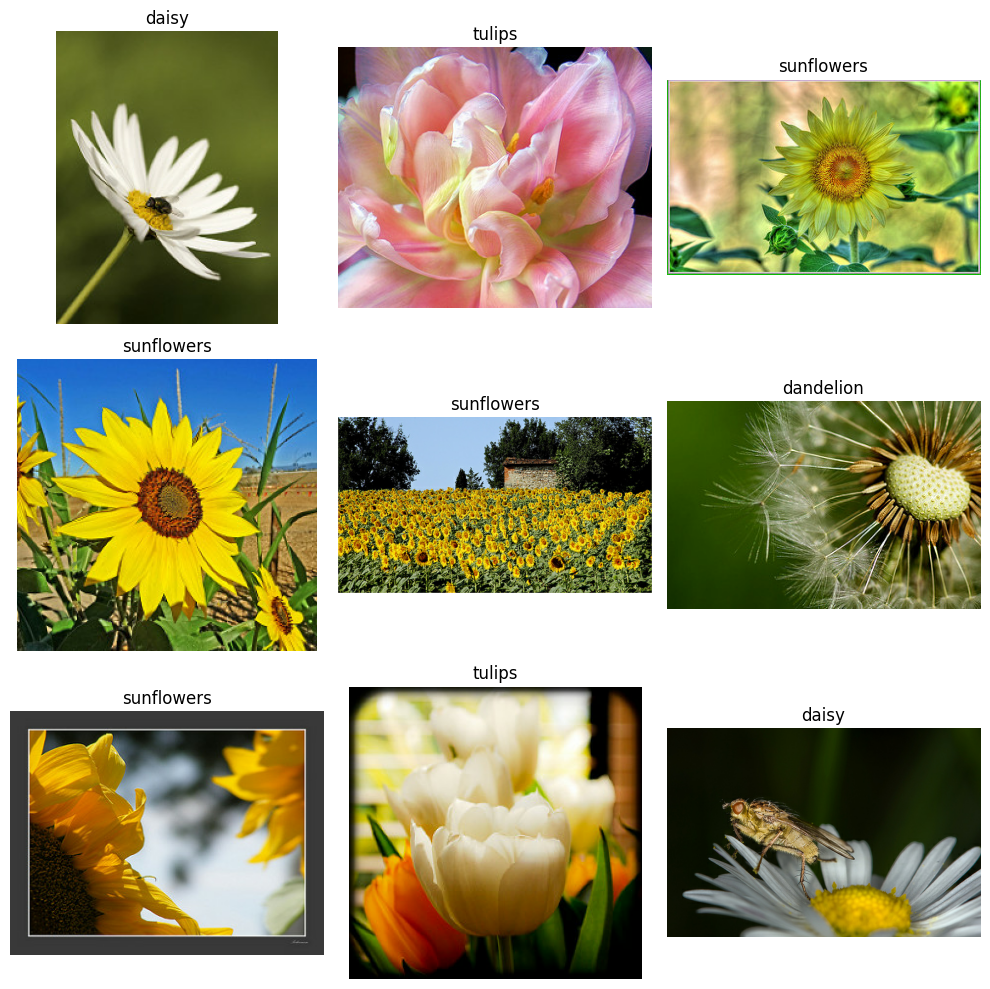

In [ ]:
# Class label names from the dataset
class_names = ds_info.features['label'].names
print("Flower categories:", class_names)

# Function to display a batch of images
def show_batch(dataset, n=9):
    plt.figure(figsize=(10, 10))
    for i, (image, label) in enumerate(dataset.take(n)):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(image.numpy())
        plt.title(class_names[label.numpy()])
        plt.axis("off")
    plt.tight_layout()
    plt.show()

show_batch(ds_train)


Min size (H, W): [180 145]
Max size (H, W): [392 500]
Mean size (H, W): [275 372]


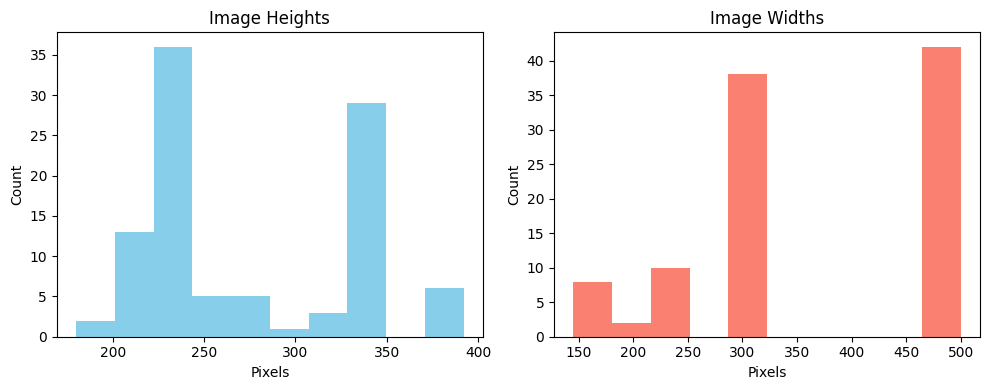

In [ ]:
# Check image dimensions
image_shapes = []

for image, _ in ds_train.take(100):
    shape = image.shape
    image_shapes.append((shape[0], shape[1]))


image_shapes_np = np.array(image_shapes)


print("Min size (H, W):", image_shapes_np.min(axis=0))
print("Max size (H, W):", image_shapes_np.max(axis=0))
print("Mean size (H, W):", image_shapes_np.mean(axis=0).astype(int))


plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.hist(image_shapes_np[:, 0], bins=10, color='skyblue')
plt.title("Image Heights")
plt.xlabel("Pixels")
plt.ylabel("Count")
plt.subplot(1, 2, 2)
plt.hist(image_shapes_np[:, 1], bins=10, color='salmon')
plt.title("Image Widths")
plt.xlabel("Pixels")
plt.ylabel("Count")
plt.tight_layout()
plt.show()


daisy: 513 images
tulips: 613 images
sunflowers: 561 images
roses: 510 images
dandelion: 739 images


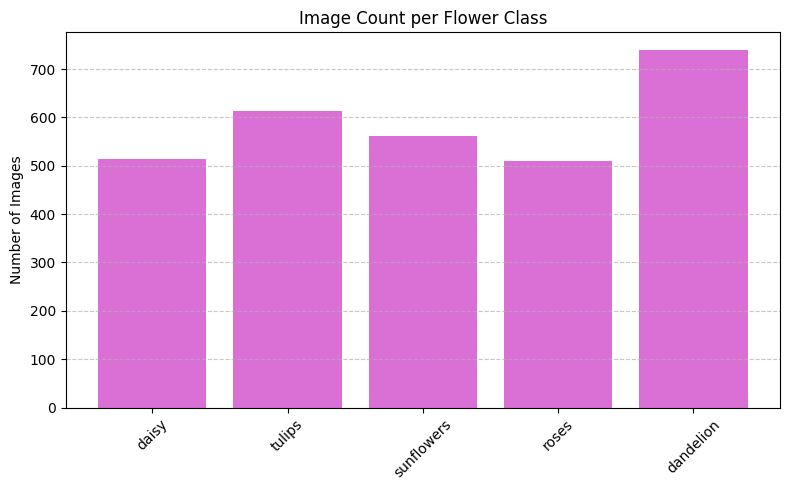

In [ ]:
# distribution of images across categories
label_counts = {}

for _, label in ds_train:
    label_val = label.numpy()
    label_counts[label_val] = label_counts.get(label_val, 0) + 1


labels = [class_names[i] for i in label_counts.keys()]
counts = [label_counts[i] for i in label_counts.keys()]


for label, count in zip(labels, counts):
    print(f"{label}: {count} images")


plt.figure(figsize=(8, 5))
plt.bar(labels, counts, color='orchid')
plt.title("Image Count per Flower Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()



Displaying: dandelion


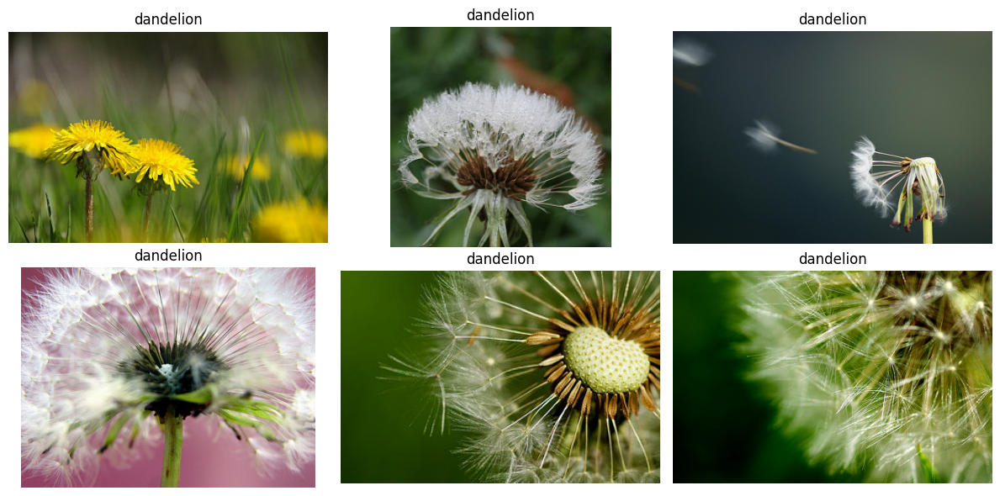


Displaying: daisy


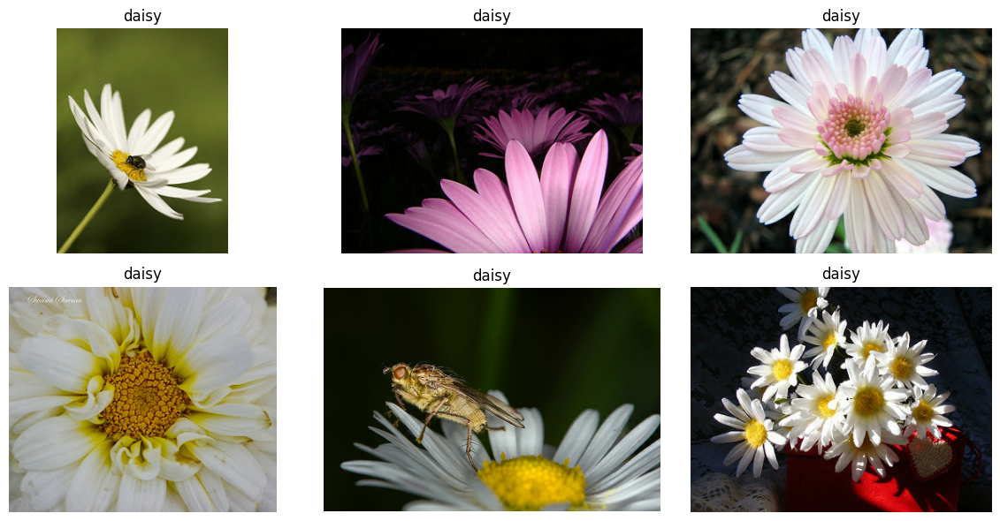


Displaying: tulips


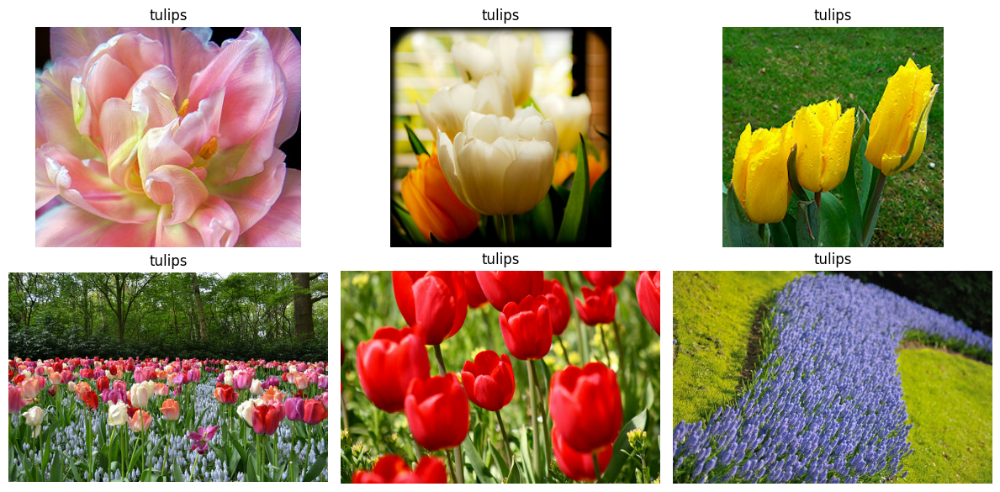


Displaying: sunflowers


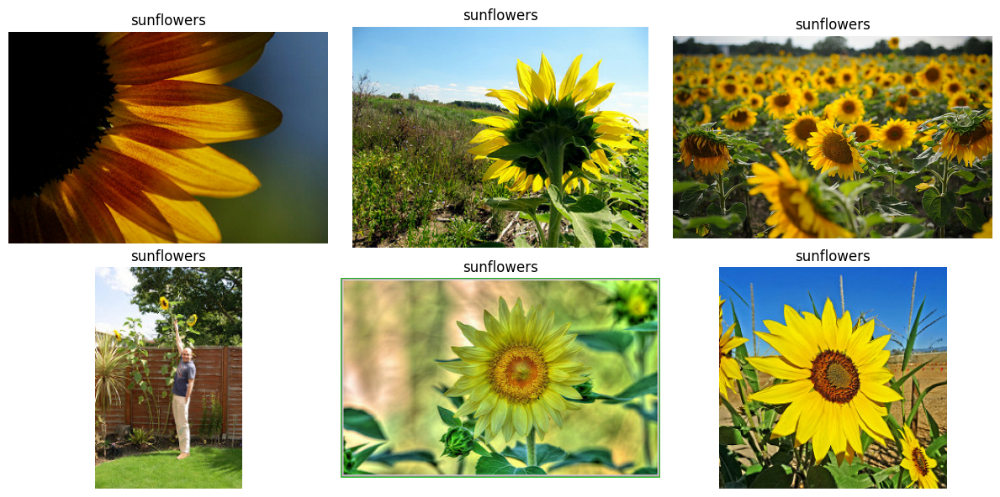


Displaying: roses


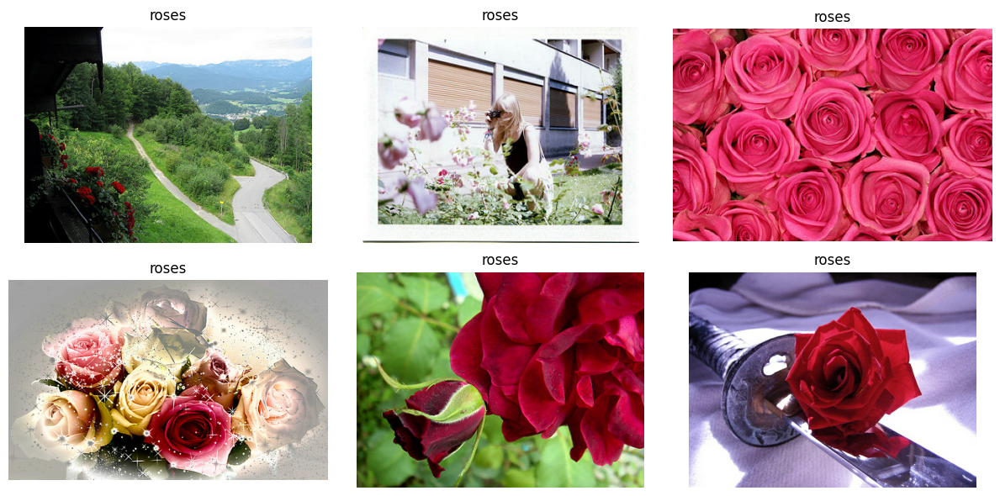

In [ ]:
import random
# Randomly show samples from each flower class
def show_images_by_class(dataset, class_index, class_name, num_images=6):
    plt.figure(figsize=(12, 6))
    count = 0
    for image, label in dataset:
        if label.numpy() == class_index:
            count += 1
            plt.subplot(2, num_images//2, count)
            plt.imshow(image.numpy())
            plt.title(class_name)
            plt.axis("off")
            if count >= num_images:
                break
    plt.tight_layout()
    plt.show()


for i, name in enumerate(class_names):
    print(f"\nDisplaying: {name}")
    show_images_by_class(ds_train, i, name)


Image Preprocessing

In [ ]:
#Resizing
def tfds_to_numpy_raw(dataset):
    images = []
    labels = []
    for image, label in dataset:
        image = tf.image.resize(image, (224, 224)).numpy()
        image = image.astype("uint8")  # Important: Keep pixel range [0–255]
        images.append(image)
        labels.append(label.numpy())
    return np.array(images), np.array(labels)

x_train_raw, y_train = tfds_to_numpy_raw(ds_train)
x_test_raw, y_test = tfds_to_numpy_raw(ds_test)



In [ ]:
#Normalization + Data Augmentation
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    zoom_range=0.1
)

train_generator = train_datagen.flow(x_train_raw, y_train, batch_size=32, shuffle=True)


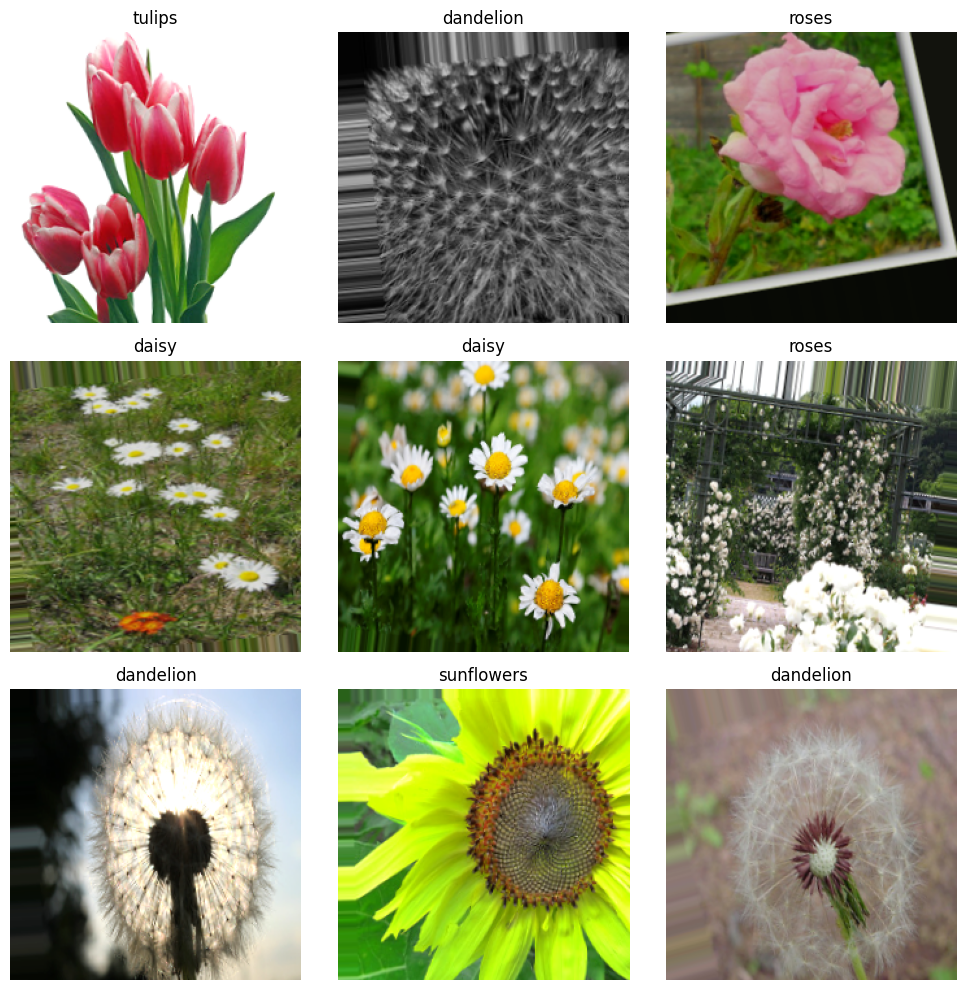

In [ ]:
images, labels = next(train_generator)

plt.figure(figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i])
    plt.title(class_names[int(labels[i])])
    plt.axis("off")
plt.tight_layout()
plt.show()




Building Neural Network Architecture using MobileNetV2

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam

# Load MobileNetV2 without the top classification layer
base_model = MobileNetV2(input_shape=(224, 224, 3),
                         include_top=False,
                         weights='imagenet')
base_model.trainable = False


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(5, activation='softmax')
])


In [ ]:
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)


Training the model

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Set early stopping to avoid overfitting
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True
)

In [ ]:
# Train the model
history = model.fit(
    train_generator,
    validation_data=(x_test_raw / 255.0, y_test),
    epochs=50,
    callbacks=[early_stop]
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
92/92 ━━━━━━━━━━━━━━━━━━━━ 74s 684ms/step - accuracy: 0.3951 - loss: 1.4659 - val_accuracy: 0.7548 - val_loss: 0.7711
Epoch 2/50
92/92 ━━━━━━━━━━━━━━━━━━━━ 42s 456ms/step - accuracy: 0.7037 - loss: 0.7926 - val_accuracy: 0.8270 - val_loss: 0.5642
Epoch 3/50
92/92 ━━━━━━━━━━━━━━━━━━━━ 56s 611ms/step - accuracy: 0.7818 - loss: 0.6207 - val_accuracy: 0.8597 - val_loss: 0.4669
Epoch 4/50
92/92 ━━━━━━━━━━━━━━━━━━━━ 48s 525ms/step - accuracy: 0.8072 - loss: 0.5363 - val_accuracy: 0.8651 - val_loss: 0.4185
Epoch 5/50
92/92 ━━━━━━━━━━━━━━━━━━━━ 40s 431ms/step - accuracy: 0.8259 - loss: 0.4871 - val_accuracy: 0.8801 - val_loss: 0.3907
Epoch 6/50
92/92 ━━━━━━━━━━━━━━━━━━━━ 46s 496ms/step - accuracy: 0.8477 - loss: 0.4559 - val_accuracy: 0.8842 - val_loss: 0.3709
Epoch 7/50
92/92 ━━━━━━━━━━━━━━━━━━━━ 41s 447ms/step - accuracy: 0.8540 - loss: 0.4200 - val_accuracy: 0.8896 - val_loss: 0.3573
Epoch 8/50
92/92 ━━━━━━━━━━━━━━━━━━━━ 40s 433ms/step - accuracy: 0.8764 - loss: 0.3556 - val_accu

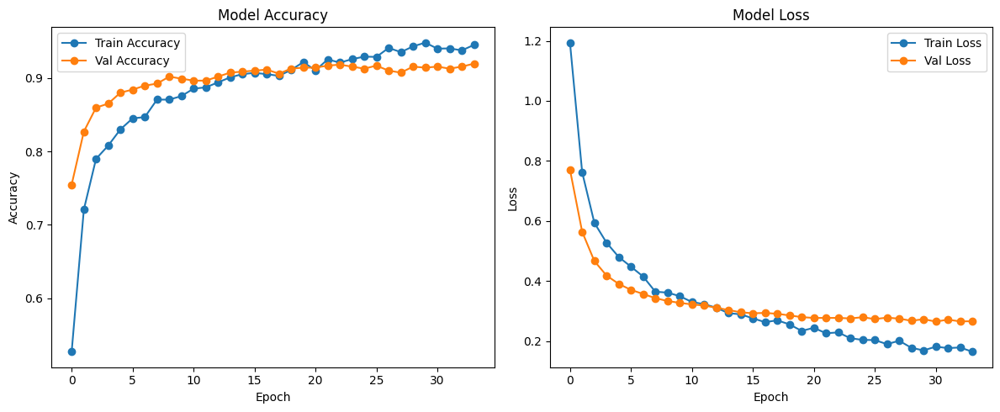

In [ ]:
# Accuracy Plot
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy', marker='o')
plt.plot(history.history['val_accuracy'], label='Val Accuracy', marker='o')
plt.title("Model Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

# Loss Plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss', marker='o')
plt.plot(history.history['val_loss'], label='Val Loss', marker='o')
plt.title("Model Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.tight_layout()
plt.show()


Model Evaluation and Analysis

In [ ]:
# Final evaluation on test set
test_loss, test_acc = model.evaluate(x_test_raw / 255.0, y_test, verbose=2)
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Test Loss: {test_loss:.4f}")


23/23 - 1s - 35ms/step - accuracy: 0.9155 - loss: 0.2653
Test Accuracy: 0.9155
Test Loss: 0.2653


In [ ]:
# Print per-class accuracy
from sklearn.metrics import classification_report

y_pred_probs = model.predict(x_test_raw / 255.0)
y_pred = np.argmax(y_pred_probs, axis=1)


print(classification_report(y_test, y_pred, target_names=class_names))


23/23 ━━━━━━━━━━━━━━━━━━━━ 8s 216ms/step
              precision    recall  f1-score   support

   dandelion       0.94      0.96      0.95       159
       daisy       0.93      0.94      0.94       120
      tulips       0.89      0.90      0.90       186
  sunflowers       0.93      0.90      0.92       138
       roses       0.88      0.88      0.88       131

    accuracy                           0.92       734
   macro avg       0.92      0.92      0.92       734
weighted avg       0.92      0.92      0.92       734



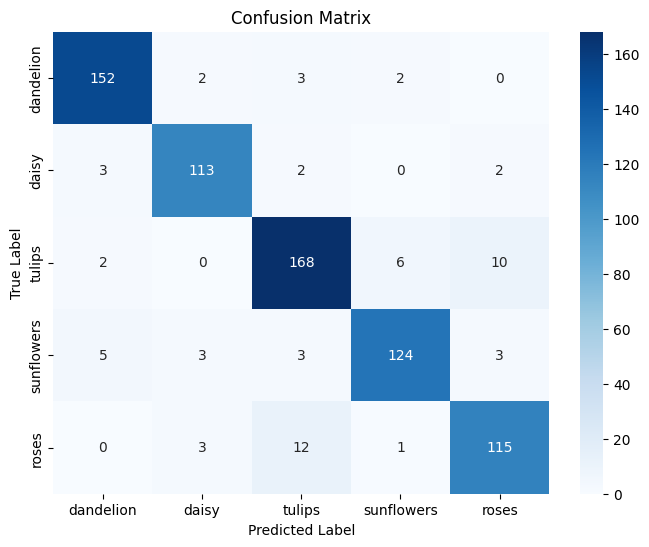

In [ ]:
#display confusion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()


In [ ]:
# Compute Top-3 Accuracy
top_k = 3
top_k_acc = tf.keras.metrics.top_k_categorical_accuracy(
    tf.keras.utils.to_categorical(y_test, num_classes=5),
    y_pred_probs,
    k=top_k
).numpy().mean()

print(f"Top-{top_k} Accuracy: {top_k_acc:.4f}")


Top-3 Accuracy: 0.9864


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


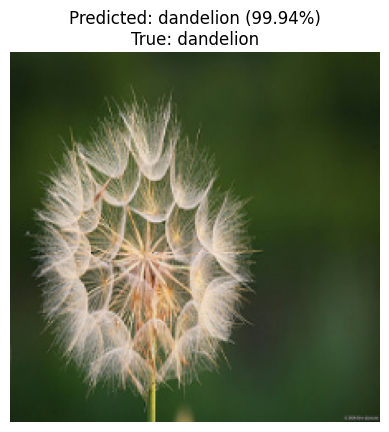

Top 3 Predictions:
dandelion: 99.94%
daisy: 0.05%
roses: 0.01%


In [ ]:
import random

# Pick a random test image  Preprocess and predict
index = random.randint(0, len(x_test_raw) - 1)
img = x_test_raw[index]
true_label = y_test[index]
img_input = np.expand_dims(img / 255.0, axis=0)

pred_probs = model.predict(img_input)
pred_label = np.argmax(pred_probs[0])
confidence = pred_probs[0][pred_label]

plt.imshow(img.astype("uint8"))
plt.axis("off")
plt.title(f"Predicted: {class_names[pred_label]} ({confidence*100:.2f}%)\nTrue: {class_names[true_label]}")
plt.show()

top3_indices = np.argsort(pred_probs[0])[-3:][::-1]
print("Top 3 Predictions:")
for i in top3_indices:
    print(f"{class_names[i]}: {pred_probs[0][i]*100:.2f}%")



In [ ]:
# Save the model
model_save_path = '/content/drive/MyDrive/models/flower_classifier_mobilenetv2.h5'
model.save(model_save_path)

print(f"Model saved to: {model_save_path}")


Model saved to: /content/drive/MyDrive/models/flower_classifier_mobilenetv2.h5


Loading model and testing with an image

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras.preprocessing import image as keras_image
class_names = ['dandelion', 'daisy', 'tulips', 'sunflowers', 'roses']

def predict_flower_image(image_path, model, class_names, top_k=3):
    """
    Predicts the class of a flower image using a trained model.
    """
    # Load and preprocess image
    img = Image.open(image_path).convert('RGB')
    img = img.resize((224, 224))
    img_array = np.array(img) / 255.0
    img_input = np.expand_dims(img_array, axis=0)

    # Predict
    pred_probs = model.predict(img_input)
    pred_label = np.argmax(pred_probs[0])
    confidence = pred_probs[0][pred_label]

    # Display image
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Predicted: {class_names[pred_label]} ({confidence*100:.2f}%)")
    plt.show()

    # Top-k predictions
    top_indices = np.argsort(pred_probs[0])[-top_k:][::-1]
    print(f"🔍 Top-{top_k} Predictions:")
    for i in top_indices:
        print(f"{class_names[i]}: {pred_probs[0][i]*100:.2f}%")


In [ ]:
from tensorflow.keras.models import load_model
model = load_model('/content/drive/MyDrive/models/flower_classifier_mobilenetv2.h5')


In [ ]:
file_path ="/content/tulip.jpg"

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


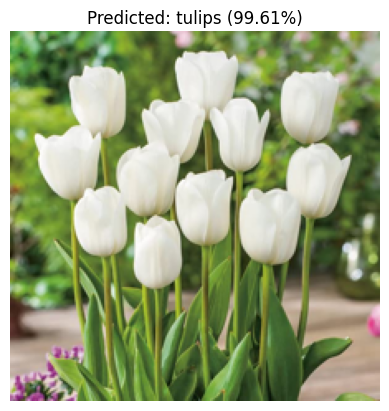

🔍 Top-3 Predictions:
tulips: 99.61%
daisy: 0.21%
dandelion: 0.13%


In [ ]:
predict_flower_image(file_path, model, class_names)